Epoch 1/100
1/1 [==============================] - 0s 218ms/step
Discriminator Loss: Real: 2.5593352662128543e-20, Fake: 0.012087265029549599 | VAE-GAN Loss: 0.01904093287885189
Epoch 2/100
1/1 [==============================] - 0s 31ms/step
Discriminator Loss: Real: 2.4081795345409773e-05, Fake: 0.029405204579234123 | VAE-GAN Loss: 0.020915282890200615
Epoch 3/100
1/1 [==============================] - 0s 30ms/step
Discriminator Loss: Real: 8.65941649822409e-20, Fake: 0.04193998500704765 | VAE-GAN Loss: 0.021216312423348427
Epoch 4/100
1/1 [==============================] - 0s 31ms/step
Discriminator Loss: Real: 1.523202747201642e-14, Fake: 0.0453287698328495 | VAE-GAN Loss: 0.01951366290450096
Epoch 5/100
1/1 [==============================] - 0s 31ms/step
Discriminator Loss: Real: 5.523925701561044e-20, Fake: 0.023235103115439415 | VAE-GAN Loss: 0.021037818863987923
Epoch 6/100
1/1 [==============================] - 0s 31ms/step
Discriminator Loss: Real: 9.02229261963892e-19, Fake: 

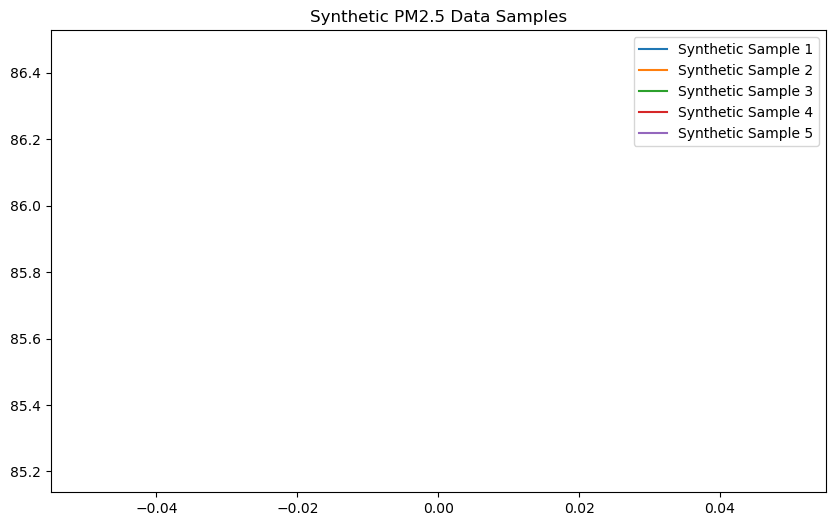

In [10]:
import seaborn as sns
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
from sklearn.preprocessing import MinMaxScaler
from tensorflow.keras.preprocessing.sequence import TimeseriesGenerator
from tensorflow.keras.layers import Input, LSTM, Dense, RepeatVector, TimeDistributed, Flatten, Lambda
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.losses import mse
from tensorflow.keras import backend as K

# Load dataset
df = pd.read_csv(r'D:\A_NAUSHAD\F\Dataset\Book8.csv', parse_dates=['Date'], index_col=['Date'])

# Data Preparation
def preprocess_data(df):
    # Extract relevant column
    pm25_data = df['Delhi_PM2.5'].values.reshape(-1, 1)
    
    # Normalize data
    scaler = MinMaxScaler()
    pm25_data = scaler.fit_transform(pm25_data)
    
    # Create sequences for TimeseriesGenerator
    time_steps = 30  # Define sequence length
    generator = TimeseriesGenerator(pm25_data, pm25_data, length=time_steps, batch_size=32)
    
    return generator, scaler

# Prepare data
generator, scaler = preprocess_data(df)

# VAE-GAN Architecture
latent_dim = 10  # Dimensionality of latent space

# Encoder
def build_encoder(input_shape, latent_dim):
    inputs = Input(shape=input_shape)
    x = LSTM(128, activation='relu')(inputs)
    x = Dense(64, activation='relu')(x)
    z_mean = Dense(latent_dim)(x)
    z_log_var = Dense(latent_dim)(x)
    return Model(inputs, [z_mean, z_log_var], name="encoder")

# Sampling layer
def sampling(args):
    z_mean, z_log_var = args
    batch = K.shape(z_mean)[0]
    dim = K.int_shape(z_mean)[1]
    epsilon = K.random_normal(shape=(batch, dim))
    return z_mean + K.exp(0.5 * z_log_var) * epsilon

# Decoder (Generator)
def build_decoder(latent_dim, output_shape):
    latent_inputs = Input(shape=(latent_dim,))
    x = Dense(64, activation='relu')(latent_inputs)
    x = RepeatVector(output_shape[0])(x)
    x = LSTM(128, activation='relu', return_sequences=True)(x)
    outputs = TimeDistributed(Dense(output_shape[1]))(x)
    return Model(latent_inputs, outputs, name="decoder")

# Discriminator
def build_discriminator(input_shape):
    inputs = Input(shape=input_shape)
    x = LSTM(128, return_sequences=True)(inputs)
    x = Flatten()(x)
    x = Dense(64, activation='relu')(x)
    outputs = Dense(1, activation='sigmoid')(x)
    return Model(inputs, outputs, name="discriminator")

# Define input shape
input_shape = (30, 1)  # Based on TimeseriesGenerator length and feature dimension

# Build models
encoder = build_encoder(input_shape, latent_dim)
decoder = build_decoder(latent_dim, input_shape)
discriminator = build_discriminator(input_shape)

# VAE-GAN Loss Function
def vae_gan_loss(y_true, y_pred, z_mean, z_log_var):
    # Reconstruction loss
    recon_loss = mse(y_true, y_pred)
    recon_loss = K.mean(recon_loss, axis=-1)  # Adjust to ensure matching shapes

    # KL divergence loss
    kl_loss = 1 + z_log_var - K.square(z_mean) - K.exp(z_log_var)
    kl_loss = K.sum(kl_loss, axis=-1)
    kl_loss *= -0.5

    # Combine losses
    total_loss = K.mean(recon_loss + kl_loss)
    return total_loss

# Compile models
discriminator.compile(optimizer=Adam(1e-4), loss='binary_crossentropy', metrics=['accuracy'])

# VAE-GAN Model
inputs = Input(shape=input_shape)
z_mean, z_log_var = encoder(inputs)
z = Lambda(sampling)([z_mean, z_log_var])
reconstructed = decoder(z)

# Discriminator for real and fake data
real_output = discriminator(inputs)
fake_output = discriminator(reconstructed)

# VAE-GAN model combines the encoder, decoder, and discriminator
vae_gan = Model(inputs, [reconstructed, real_output, fake_output])
vae_gan.add_loss(vae_gan_loss(inputs, reconstructed, z_mean, z_log_var))
vae_gan.compile(optimizer=Adam(1e-4))

# Training loop
epochs = 100
for epoch in range(epochs):
    print(f'Epoch {epoch+1}/{epochs}')
    for x, y in generator:
        # Train Discriminator
        z_mean_pred, z_log_var_pred = encoder.predict(x)
        generated_data = decoder.predict(z_mean_pred)
        real_labels = np.ones((x.shape[0], 1))
        fake_labels = np.zeros((x.shape[0], 1))
        d_loss_real = discriminator.train_on_batch(x, real_labels)
        d_loss_fake = discriminator.train_on_batch(generated_data, fake_labels)

        # Train VAE-GAN
        vae_gan_loss = vae_gan.train_on_batch(x, None)

    print(f'Discriminator Loss: Real: {d_loss_real[0]}, Fake: {d_loss_fake[0]} | VAE-GAN Loss: {vae_gan_loss}')

# Generate synthetic data
def generate_synthetic_data(decoder, num_samples):
    latent_samples = np.random.normal(size=(num_samples, latent_dim))
    generated_sequences = decoder.predict(latent_samples)
    return scaler.inverse_transform(generated_sequences.reshape(-1, generated_sequences.shape[-1]))

# Generate and plot synthetic data
synthetic_data = generate_synthetic_data(decoder, 100)

plt.figure(figsize=(10, 6))
for i in range(5):
    plt.plot(synthetic_data[i], label=f'Synthetic Sample {i+1}')
plt.legend()
plt.title('Synthetic PM2.5 Data Samples')
plt.show()


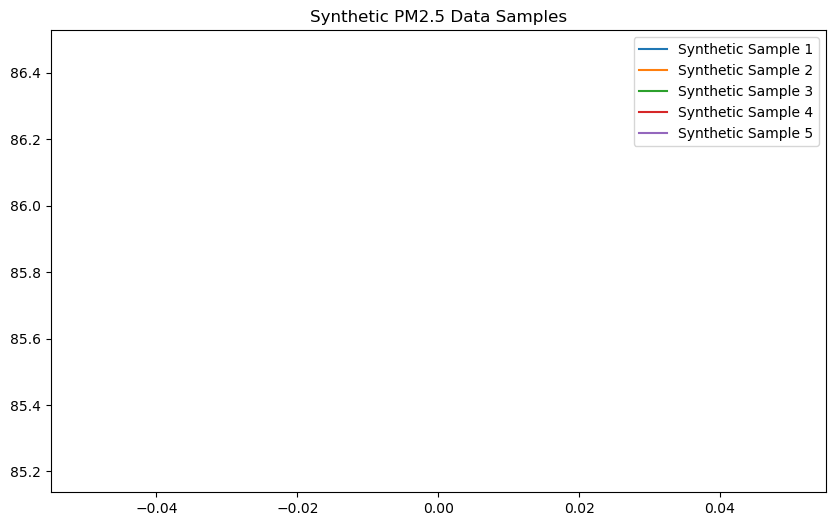

In [11]:
plt.figure(figsize=(10, 6))
for i in range(5):
    plt.plot(synthetic_data[i], label=f'Synthetic Sample {i+1}')
plt.legend()
plt.title('Synthetic PM2.5 Data Samples')
plt.show()

Epoch 1/10
1/1 [==============================] - 0s 200ms/step
Discriminator Loss: Real: 1.5793723818460954e-14, Fake: 0.03627122566103935 | VAE-GAN Loss: 0.029093194752931595
Epoch 2/10
1/1 [==============================] - 0s 32ms/step
Discriminator Loss: Real: 2.7003197854841288e-12, Fake: 0.03492363169789314 | VAE-GAN Loss: 0.028224127367138863
Epoch 3/10
1/1 [==============================] - 0s 31ms/step
Discriminator Loss: Real: 1.455910531023008e-10, Fake: 0.6427045464515686 | VAE-GAN Loss: 0.02259126305580139
Epoch 4/10
1/1 [==============================] - 0s 20ms/step
Discriminator Loss: Real: 2.7090827844911125e-11, Fake: 0.6128072142601013 | VAE-GAN Loss: 0.016595598310232162
Epoch 5/10
1/1 [==============================] - 0s 31ms/step
Discriminator Loss: Real: 4.994873403774136e-09, Fake: 0.5837368369102478 | VAE-GAN Loss: 0.015477431938052177
Epoch 6/10
1/1 [==============================] - 0s 32ms/step
Discriminator Loss: Real: 8.896325454088583e-08, Fake: 0.04923

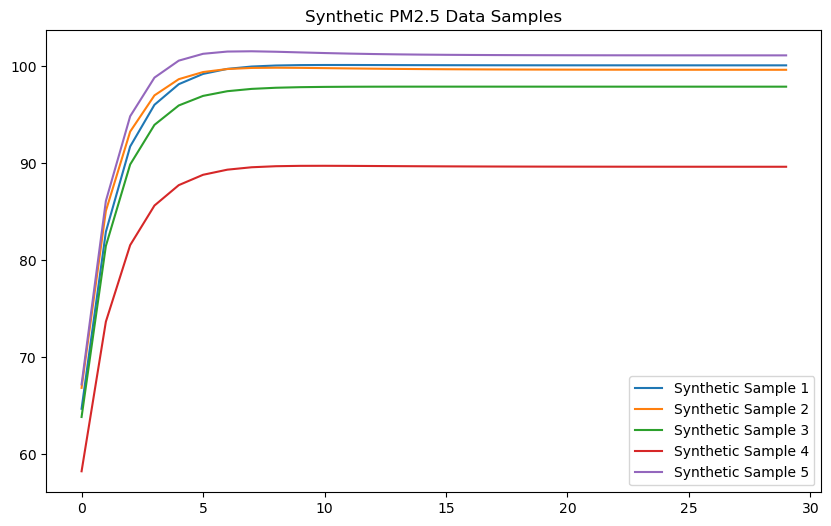

In [2]:
import seaborn as sns
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
from sklearn.preprocessing import MinMaxScaler
from tensorflow.keras.preprocessing.sequence import TimeseriesGenerator
from tensorflow.keras.layers import Input, LSTM, Dense, RepeatVector, TimeDistributed, Flatten, Lambda
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.losses import mse
from tensorflow.keras import backend as K

# Load dataset
df = pd.read_csv(r'D:\A_NAUSHAD\F\Dataset\Book8.csv', parse_dates=['Date'], index_col=['Date'])

# Data Preparation
def preprocess_data(df):
    # Extract relevant column
    pm25_data = df['Delhi_PM2.5'].values.reshape(-1, 1)
    
    # Normalize data
    scaler = MinMaxScaler()
    pm25_data = scaler.fit_transform(pm25_data)
    
    # Create sequences for TimeseriesGenerator
    time_steps = 30  # Define sequence length
    generator = TimeseriesGenerator(pm25_data, pm25_data, length=time_steps, batch_size=32)
    
    return generator, scaler

# Prepare data
generator, scaler = preprocess_data(df)

# VAE-GAN Architecture
latent_dim = 5  # Reduced dimensionality of latent space for quicker training

# Encoder
def build_encoder(input_shape, latent_dim):
    inputs = Input(shape=input_shape)
    x = LSTM(64, activation='relu')(inputs)  # Reduced complexity
    x = Dense(32, activation='relu')(x)
    z_mean = Dense(latent_dim)(x)
    z_log_var = Dense(latent_dim)(x)
    return Model(inputs, [z_mean, z_log_var], name="encoder")

# Sampling layer
def sampling(args):
    z_mean, z_log_var = args
    batch = K.shape(z_mean)[0]
    dim = K.int_shape(z_mean)[1]
    epsilon = K.random_normal(shape=(batch, dim))
    return z_mean + K.exp(0.5 * z_log_var) * epsilon

# Decoder (Generator)
def build_decoder(latent_dim, output_shape):
    latent_inputs = Input(shape=(latent_dim,))
    x = Dense(32, activation='relu')(latent_inputs)
    x = RepeatVector(output_shape[0])(x)
    x = LSTM(64, activation='relu', return_sequences=True)(x)  # Reduced complexity
    outputs = TimeDistributed(Dense(output_shape[1]))(x)
    return Model(latent_inputs, outputs, name="decoder")

# Discriminator
def build_discriminator(input_shape):
    inputs = Input(shape=input_shape)
    x = LSTM(64, return_sequences=True)(inputs)  # Reduced complexity
    x = Flatten()(x)
    x = Dense(32, activation='relu')(x)
    outputs = Dense(1, activation='sigmoid')(x)
    return Model(inputs, outputs, name="discriminator")

# Define input shape
input_shape = (30, 1)  # Based on TimeseriesGenerator length and feature dimension

# Build models
encoder = build_encoder(input_shape, latent_dim)
decoder = build_decoder(latent_dim, input_shape)
discriminator = build_discriminator(input_shape)

# VAE-GAN Loss Function
def vae_gan_loss(y_true, y_pred, z_mean, z_log_var):
    # Reconstruction loss
    recon_loss = mse(y_true, y_pred)
    recon_loss = K.mean(recon_loss, axis=-1)  # Adjust to ensure matching shapes

    # KL divergence loss
    kl_loss = 1 + z_log_var - K.square(z_mean) - K.exp(z_log_var)
    kl_loss = K.sum(kl_loss, axis=-1)
    kl_loss *= -0.5

    # Combine losses
    total_loss = K.mean(recon_loss + kl_loss)
    return total_loss

# Compile models
discriminator.compile(optimizer=Adam(1e-4), loss='binary_crossentropy', metrics=['accuracy'])

# VAE-GAN Model
inputs = Input(shape=input_shape)
z_mean, z_log_var = encoder(inputs)
z = Lambda(sampling)([z_mean, z_log_var])
reconstructed = decoder(z)

# Discriminator for real and fake data
real_output = discriminator(inputs)
fake_output = discriminator(reconstructed)

# VAE-GAN model combines the encoder, decoder, and discriminator
vae_gan = Model(inputs, [reconstructed, real_output, fake_output])
vae_gan.add_loss(vae_gan_loss(inputs, reconstructed, z_mean, z_log_var))
vae_gan.compile(optimizer=Adam(1e-4))

# Training loop
epochs = 10  # Reduced number of epochs for faster testing
for epoch in range(epochs):
    print(f'Epoch {epoch+1}/{epochs}')
    for x, y in generator:
        # Train Discriminator
        z_mean_pred, z_log_var_pred = encoder.predict(x)
        generated_data = decoder.predict(z_mean_pred)
        real_labels = np.ones((x.shape[0], 1))
        fake_labels = np.zeros((x.shape[0], 1))
        d_loss_real = discriminator.train_on_batch(x, real_labels)
        d_loss_fake = discriminator.train_on_batch(generated_data, fake_labels)

        # Train VAE-GAN
        vae_gan_loss = vae_gan.train_on_batch(x, None)

    print(f'Discriminator Loss: Real: {d_loss_real[0]}, Fake: {d_loss_fake[0]} | VAE-GAN Loss: {vae_gan_loss}')

# Generate synthetic data
def generate_synthetic_data(decoder, num_samples):
    latent_samples = np.random.normal(size=(num_samples, latent_dim))
    generated_sequences = decoder.predict(latent_samples)
    return scaler.inverse_transform(generated_sequences.reshape(-1, generated_sequences.shape[-1]))

# Generate and plot synthetic data
synthetic_data = generate_synthetic_data(decoder, 100)

plt.figure(figsize=(10, 6))
for i in range(5):
    plt.plot(synthetic_data[i * input_shape[0]:(i + 1) * input_shape[0]], label=f'Synthetic Sample {i+1}')
plt.legend()
plt.title('Synthetic PM2.5 Data Samples')
plt.show()


In [2]:
import seaborn as sns
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error, mean_absolute_error
from tensorflow.keras.preprocessing.sequence import TimeseriesGenerator
from tensorflow.keras.layers import Input, LSTM, Dense, RepeatVector, TimeDistributed, Flatten, Lambda
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.losses import mse
from tensorflow.keras import backend as K
import csv

# Load dataset
df = pd.read_csv(r'D:\A_NAUSHAD\F\Dataset\Book8.csv', parse_dates=['Date'], index_col=['Date'])

# Data Preparation
def preprocess_data(df):
    # Extract relevant column
    pm25_data = df['Delhi_PM2.5'].values.reshape(-1, 1)
    
    # Normalize data
    scaler = MinMaxScaler()
    pm25_data = scaler.fit_transform(pm25_data)
    
    # Create sequences for TimeseriesGenerator
    time_steps = 30  # Define sequence length
    generator = TimeseriesGenerator(pm25_data, pm25_data, length=time_steps, batch_size=32)
    
    return generator, scaler

# Prepare data
generator, scaler = preprocess_data(df)

# VAE-GAN Architecture
latent_dim = 5  # Reduced dimensionality of latent space for quicker training

# Encoder
def build_encoder(input_shape, latent_dim):
    inputs = Input(shape=input_shape)
    x = LSTM(64, activation='relu')(inputs)  # Reduced complexity
    x = Dense(32, activation='relu')(x)
    z_mean = Dense(latent_dim)(x)
    z_log_var = Dense(latent_dim)(x)
    return Model(inputs, [z_mean, z_log_var], name="encoder")

# Sampling layer
def sampling(args):
    z_mean, z_log_var = args
    batch = K.shape(z_mean)[0]
    dim = K.int_shape(z_mean)[1]
    epsilon = K.random_normal(shape=(batch, dim))
    return z_mean + K.exp(0.5 * z_log_var) * epsilon

# Decoder (Generator)
def build_decoder(latent_dim, output_shape):
    latent_inputs = Input(shape=(latent_dim,))
    x = Dense(32, activation='relu')(latent_inputs)
    x = RepeatVector(output_shape[0])(x)
    x = LSTM(64, activation='relu', return_sequences=True)(x)  # Reduced complexity
    outputs = TimeDistributed(Dense(output_shape[1]))(x)
    return Model(latent_inputs, outputs, name="decoder")

# Discriminator
def build_discriminator(input_shape):
    inputs = Input(shape=input_shape)
    x = LSTM(64, return_sequences=True)(inputs)  # Reduced complexity
    x = Flatten()(x)
    x = Dense(32, activation='relu')(x)
    outputs = Dense(1, activation='sigmoid')(x)
    return Model(inputs, outputs, name="discriminator")

# Define input shape
input_shape = (30, 1)  # Based on TimeseriesGenerator length and feature dimension

# Build models
encoder = build_encoder(input_shape, latent_dim)
decoder = build_decoder(latent_dim, input_shape)
discriminator = build_discriminator(input_shape)

# VAE-GAN Loss Function
def vae_gan_loss(y_true, y_pred, z_mean, z_log_var):
    # Reconstruction loss
    recon_loss = mse(y_true, y_pred)
    recon_loss = K.mean(recon_loss, axis=-1)  # Adjust to ensure matching shapes

    # KL divergence loss
    kl_loss = 1 + z_log_var - K.square(z_mean) - K.exp(z_log_var)
    kl_loss = K.sum(kl_loss, axis=-1)
    kl_loss *= -0.5

    # Combine losses
    total_loss = K.mean(recon_loss + kl_loss)
    return total_loss

# Compile models
discriminator.compile(optimizer=Adam(1e-4), loss='binary_crossentropy', metrics=['accuracy'])

# VAE-GAN Model
inputs = Input(shape=input_shape)
z_mean, z_log_var = encoder(inputs)
z = Lambda(sampling)([z_mean, z_log_var])
reconstructed = decoder(z)

# Discriminator for real and fake data
real_output = discriminator(inputs)
fake_output = discriminator(reconstructed)

# VAE-GAN model combines the encoder, decoder, and discriminator
vae_gan = Model(inputs, [reconstructed, real_output, fake_output])
vae_gan.add_loss(vae_gan_loss(inputs, reconstructed, z_mean, z_log_var))
vae_gan.compile(optimizer=Adam(1e-4))

# Training loop
epochs = 10  # Reduced number of epochs for faster testing
for epoch in range(epochs):
    print(f'Epoch {epoch+1}/{epochs}')
    for x, y in generator:
        # Train Discriminator
        z_mean_pred, z_log_var_pred = encoder.predict(x)
        generated_data = decoder.predict(z_mean_pred)
        real_labels = np.ones((x.shape[0], 1))
        fake_labels = np.zeros((x.shape[0], 1))
        d_loss_real = discriminator.train_on_batch(x, real_labels)
        d_loss_fake = discriminator.train_on_batch(generated_data, fake_labels)

        # Train VAE-GAN
        vae_gan_loss = vae_gan.train_on_batch(x, None)

    print(f'Discriminator Loss: Real: {d_loss_real[0]}, Fake: {d_loss_fake[0]} | VAE-GAN Loss: {vae_gan_loss}')

# Generate synthetic data
def generate_synthetic_data(decoder, num_samples):
    latent_samples = np.random.normal(size=(num_samples, latent_dim))
    generated_sequences = decoder.predict(latent_samples)
    return scaler.inverse_transform(generated_sequences.reshape(-1, generated_sequences.shape[-1]))

# Evaluate the model
def evaluate_model(real_data, synthetic_data, scaler):
    # Inverse transform the normalized data back to the original scale
    real_data_inv = scaler.inverse_transform(real_data.reshape(-1, 1))
    synthetic_data_inv = scaler.inverse_transform(synthetic_data.reshape(-1, 1))

    # Calculate evaluation metrics
    mse = mean_squared_error(real_data_inv, synthetic_data_inv)
    mae = mean_absolute_error(real_data_inv, synthetic_data_inv)

    return mse, mae

# Prepare to store evaluation results
results = []

# Evaluate the model
for x, _ in generator:
    generated_data = decoder.predict(encoder.predict(x)[0])
    mse, mae = evaluate_model(x, generated_data, scaler)
    results.append({'MSE': mse, 'MAE': mae})

# Save results to a CSV file
csv_file_path = 'vae_gan_evaluation_results.csv'
with open(csv_file_path, mode='w', newline='') as file:
    writer = csv.DictWriter(file, fieldnames=['MSE', 'MAE'])
    writer.writeheader()
    for result in results:
        writer.writerow(result)

print(f"Evaluation results saved to {csv_file_path}")

# Load the evaluation results from CSV
results_df = pd.read_csv(csv_file_path)

# Plot the results
plt.figure(figsize=(14, 6))







Epoch 1/10
1/1 [==============================] - 0s 216ms/step

1/1 [==============================] - 0s 220ms/step
Discriminator Loss: Real: 4.911511032077016e-18, Fake: 0.0161942970007658 | VAE-GAN Loss: 0.03340384364128113
Epoch 2/10
1/1 [==============================] - 0s 31ms/step
Discriminator Loss: Real: 2.056307994908605e-21, Fake: 0.059854619204998016 | VAE-GAN Loss: 0.03332294896245003
Epoch 3/10
1/1 [==============================] - 0s 31ms/step
Discriminator Loss: Real: 9.693116887088403e-22, Fake: 0.029753761366009712 | VAE-GAN Loss: 0.02193586155772209
Epoch 4/10
1/1 [==============================] - 0s 31ms/step
Discriminator Loss: Real: 1.78692297671943e-21, Fake: 0.03402150049805641 | VAE-GAN Loss: 0.022216083481907845
Epoch 5/10
1/1 [==============================] - 0s 47ms/step
Discriminator Loss: Real: 6.301326197109718e-21, Fake: 0.045592453330755234 | VAE-GAN Loss: 0.017267121002078056
Epoch 6/10
1/1 [==============================] - 0s 31ms/step
Discri

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

Epoch 1/10
1/1 [==============================] - 0s 187ms/step
Discriminator Loss: Real: 3.5701680693285537e-20, Fake: 0.10009639710187912 | VAE-GAN Loss: 0.08799517899751663
Epoch 2/10
1/1 [==============================] - 0s 31ms/step
Discriminator Loss: Real: 7.115980451755337e-19, Fake: 0.00694353599101305 | VAE-GAN Loss: 0.06039360538125038
Epoch 3/10
1/1 [==============================] - 0s 31ms/step
Discriminator Loss: Real: 4.122817130098035e-20, Fake: 0.01614159345626831 | VAE-GAN Loss: 0.054565154016017914
Epoch 4/10
1/1 [==============================] - 0s 31ms/step
Discriminator Loss: Real: 4.545682134369314e-19, Fake: 1.9227180480957031 | VAE-GAN Loss: 0.05209358036518097
Epoch 5/10
1/1 [==============================] - 0s 27ms/step
Discriminator Loss: Real: 1.3753014560727978e-16, Fake: 0.01124967448413372 | VAE-GAN Loss: 0.055931005626916885
Epoch 6/10
1/1 [==============================] - 0s 31ms/step
Discriminator Loss: Real: 9.188087324945066e-18, Fake: 0.037063

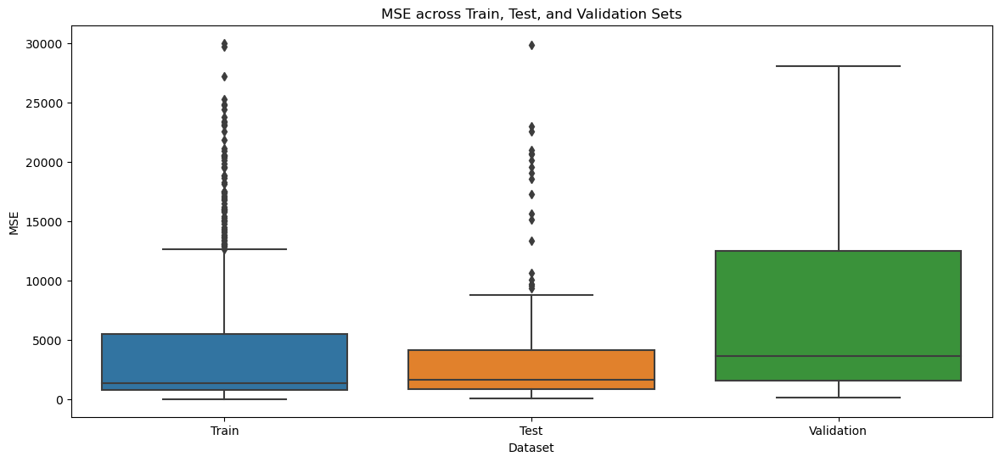

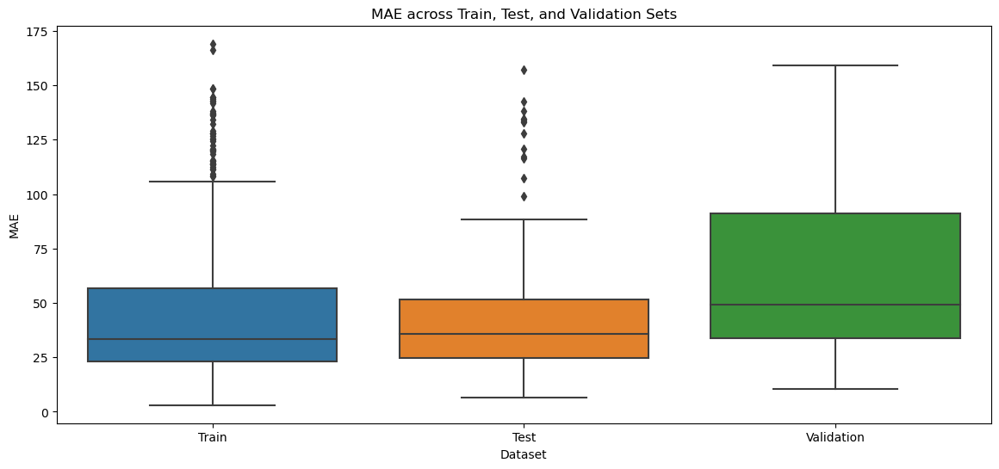

In [4]:
import seaborn as sns
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error, mean_absolute_error
from tensorflow.keras.preprocessing.sequence import TimeseriesGenerator
from tensorflow.keras.layers import Input, LSTM, Dense, RepeatVector, TimeDistributed, Flatten, Lambda
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.losses import mse
from tensorflow.keras import backend as K
import csv

# Load dataset
df = pd.read_csv(r'D:\A_NAUSHAD\F\Dataset\Book8.csv', parse_dates=['Date'], index_col=['Date'])

# Data Preparation
def preprocess_data(df, train_size=0.7, test_size=0.15, validation_size=0.15):
    # Extract relevant column
    pm25_data = df['Delhi_PM2.5'].values.reshape(-1, 1)
    
    # Normalize data
    scaler = MinMaxScaler()
    pm25_data = scaler.fit_transform(pm25_data)
    
    # Split data
    n = len(pm25_data)
    train_data = pm25_data[:int(train_size * n)]
    test_data = pm25_data[int(train_size * n):int((train_size + test_size) * n)]
    validation_data = pm25_data[int((train_size + test_size) * n):]
    
    # Create sequences for TimeseriesGenerator
    time_steps = 30  # Define sequence length
    train_generator = TimeseriesGenerator(train_data, train_data, length=time_steps, batch_size=32)
    test_generator = TimeseriesGenerator(test_data, test_data, length=time_steps, batch_size=32)
    validation_generator = TimeseriesGenerator(validation_data, validation_data, length=time_steps, batch_size=32)
    
    return train_generator, test_generator, validation_generator, scaler

# Prepare data
train_generator, test_generator, validation_generator, scaler = preprocess_data(df)

# VAE-GAN Architecture
latent_dim = 5  # Reduced dimensionality of latent space for quicker training

# Encoder
def build_encoder(input_shape, latent_dim):
    inputs = Input(shape=input_shape)
    x = LSTM(64, activation='relu')(inputs)
    x = Dense(32, activation='relu')(x)
    z_mean = Dense(latent_dim)(x)
    z_log_var = Dense(latent_dim)(x)
    return Model(inputs, [z_mean, z_log_var], name="encoder")

# Sampling layer
def sampling(args):
    z_mean, z_log_var = args
    batch = K.shape(z_mean)[0]
    dim = K.int_shape(z_mean)[1]
    epsilon = K.random_normal(shape=(batch, dim))
    return z_mean + K.exp(0.5 * z_log_var) * epsilon

# Decoder (Generator)
def build_decoder(latent_dim, output_shape):
    latent_inputs = Input(shape=(latent_dim,))
    x = Dense(32, activation='relu')(latent_inputs)
    x = RepeatVector(output_shape[0])(x)
    x = LSTM(64, activation='relu', return_sequences=True)(x)
    outputs = TimeDistributed(Dense(output_shape[1]))(x)
    return Model(latent_inputs, outputs, name="decoder")

# Discriminator
def build_discriminator(input_shape):
    inputs = Input(shape=input_shape)
    x = LSTM(64, return_sequences=True)(inputs)
    x = Flatten()(x)
    x = Dense(32, activation='relu')(x)
    outputs = Dense(1, activation='sigmoid')(x)
    return Model(inputs, outputs, name="discriminator")

# Define input shape
input_shape = (30, 1)

# Build models
encoder = build_encoder(input_shape, latent_dim)
decoder = build_decoder(latent_dim, input_shape)
discriminator = build_discriminator(input_shape)

# VAE-GAN Loss Function
def vae_gan_loss(y_true, y_pred, z_mean, z_log_var):
    # Reconstruction loss
    recon_loss = mse(y_true, y_pred)
    recon_loss = K.mean(recon_loss, axis=-1)

    # KL divergence loss
    kl_loss = 1 + z_log_var - K.square(z_mean) - K.exp(z_log_var)
    kl_loss = K.sum(kl_loss, axis=-1)
    kl_loss *= -0.5

    # Combine losses
    total_loss = K.mean(recon_loss + kl_loss)
    return total_loss

# Compile models
discriminator.compile(optimizer=Adam(1e-4), loss='binary_crossentropy', metrics=['accuracy'])

# VAE-GAN Model
inputs = Input(shape=input_shape)
z_mean, z_log_var = encoder(inputs)
z = Lambda(sampling)([z_mean, z_log_var])
reconstructed = decoder(z)

# Discriminator for real and fake data
real_output = discriminator(inputs)
fake_output = discriminator(reconstructed)

# VAE-GAN model combines the encoder, decoder, and discriminator
vae_gan = Model(inputs, [reconstructed, real_output, fake_output])
vae_gan.add_loss(vae_gan_loss(inputs, reconstructed, z_mean, z_log_var))
vae_gan.compile(optimizer=Adam(1e-4))

# Training loop
epochs = 10
for epoch in range(epochs):
    print(f'Epoch {epoch+1}/{epochs}')
    for x, y in train_generator:
        # Train Discriminator
        z_mean_pred, z_log_var_pred = encoder.predict(x)
        generated_data = decoder.predict(z_mean_pred)
        real_labels = np.ones((x.shape[0], 1))
        fake_labels = np.zeros((x.shape[0], 1))
        d_loss_real = discriminator.train_on_batch(x, real_labels)
        d_loss_fake = discriminator.train_on_batch(generated_data, fake_labels)

        # Train VAE-GAN
        vae_gan_loss = vae_gan.train_on_batch(x, None)

    print(f'Discriminator Loss: Real: {d_loss_real[0]}, Fake: {d_loss_fake[0]} | VAE-GAN Loss: {vae_gan_loss}')

# Generate synthetic data
def generate_synthetic_data(decoder, num_samples):
    latent_samples = np.random.normal(size=(num_samples, latent_dim))
    generated_sequences = decoder.predict(latent_samples)
    return scaler.inverse_transform(generated_sequences.reshape(-1, generated_sequences.shape[-1]))

# Evaluate the model
def evaluate_model(real_data, synthetic_data, scaler):
    # Inverse transform the normalized data back to the original scale
    real_data_inv = scaler.inverse_transform(real_data.reshape(-1, 1))
    synthetic_data_inv = scaler.inverse_transform(synthetic_data.reshape(-1, 1))

    # Calculate evaluation metrics
    mse = mean_squared_error(real_data_inv, synthetic_data_inv)
    mae = mean_absolute_error(real_data_inv, synthetic_data_inv)

    return mse, mae

# Prepare to store evaluation results
results = []

# Evaluate the model on train, test, and validation sets
def evaluate_on_datasets(generator, dataset_name):
    for x, _ in generator:
        generated_data = decoder.predict(encoder.predict(x)[0])
        mse, mae = evaluate_model(x, generated_data, scaler)
        results.append({'Dataset': dataset_name, 'MSE': mse, 'MAE': mae})

# Evaluate
evaluate_on_datasets(train_generator, 'Train')
evaluate_on_datasets(test_generator, 'Test')
evaluate_on_datasets(validation_generator, 'Validation')

# Save results to a CSV file
csv_file_path = 'vae_gan_evaluation_results.csv'
with open(csv_file_path, mode='w', newline='') as file:
    writer = csv.DictWriter(file, fieldnames=['Dataset', 'MSE', 'MAE'])
    writer.writeheader()
    for result in results:
        writer.writerow(result)

print(f"Evaluation results saved to {csv_file_path}")

# Load the evaluation results from CSV
results_df = pd.read_csv(csv_file_path)

# Plot the results
plt.figure(figsize=(14, 6))
sns.boxplot(x='Dataset', y='MSE', data=results_df)
plt.title('MSE across Train, Test, and Validation Sets')
plt.show()

plt.figure(figsize=(14, 6))
sns.boxplot(x='Dataset', y='MAE', data=results_df)
plt.title('MAE across Train, Test, and Validation Sets')
plt.show()
 

Epoch 1/10
1/1 [==============================] - 0s 188ms/step
Discriminator Loss: Real: 4.982536647219698e-17, Fake: 0.06816945970058441 | VAE-GAN Loss: 0.09301870316267014
Epoch 2/10
1/1 [==============================] - 0s 47ms/step
Discriminator Loss: Real: 1.9374884251762044e-14, Fake: 0.007990875281393528 | VAE-GAN Loss: 0.06443498283624649
Epoch 3/10
1/1 [==============================] - 0s 31ms/step
Discriminator Loss: Real: 7.407524549307709e-08, Fake: 0.678360104560852 | VAE-GAN Loss: 0.055129311978816986
Epoch 4/10
1/1 [==============================] - 0s 16ms/step
Discriminator Loss: Real: 0.00014442527026403695, Fake: 0.6561221480369568 | VAE-GAN Loss: 0.053940318524837494
Epoch 5/10
1/1 [==============================] - 0s 44ms/step
Discriminator Loss: Real: 8.682539373694453e-06, Fake: 0.6371142268180847 | VAE-GAN Loss: 0.05284153297543526
Epoch 6/10
1/1 [==============================] - 0s 31ms/step
Discriminator Loss: Real: 2.6067456815326295e-07, Fake: 0.6171154

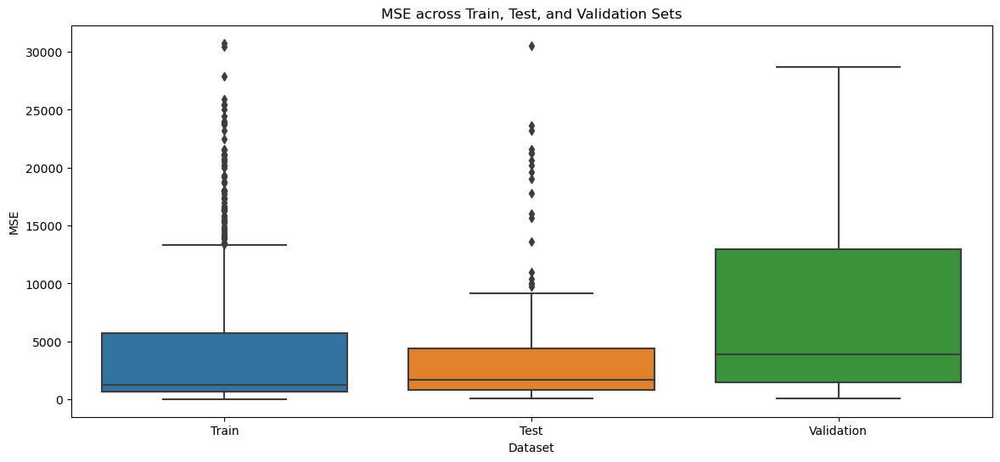

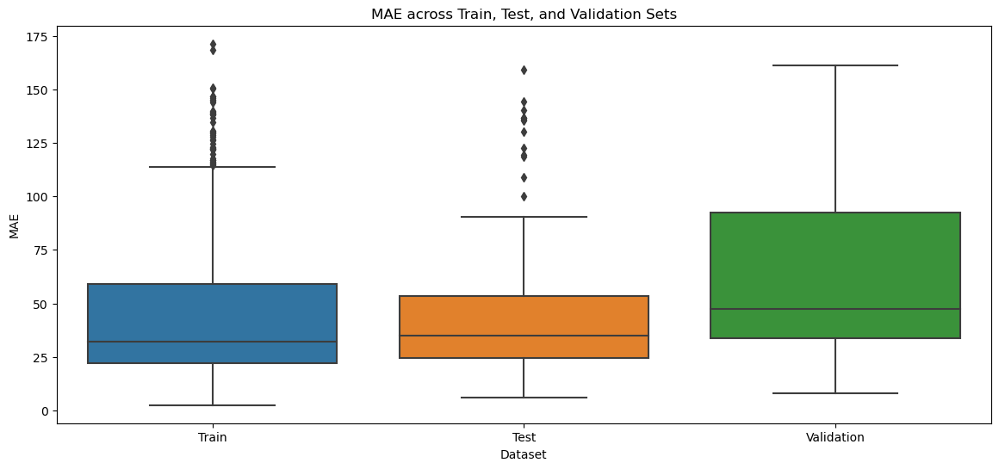

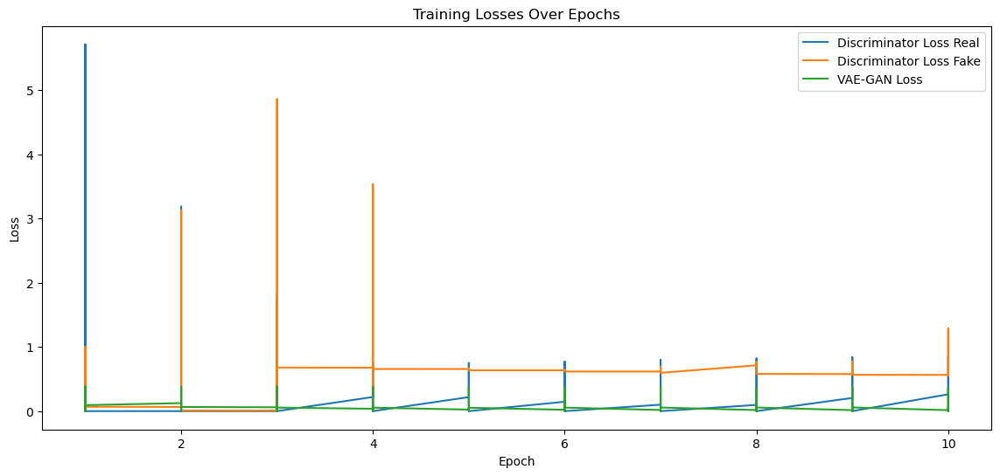

In [6]:
import seaborn as sns
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error, mean_absolute_error
from tensorflow.keras.preprocessing.sequence import TimeseriesGenerator
from tensorflow.keras.layers import Input, LSTM, Dense, RepeatVector, TimeDistributed, Flatten, Lambda
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.losses import mse
from tensorflow.keras import backend as K
import csv

# Load dataset
df = pd.read_csv(r'D:\A_NAUSHAD\F\Dataset\Book8.csv', parse_dates=['Date'], index_col=['Date'])

# Data Preparation
def preprocess_data(df, train_size=0.7, validation_size=0.15, test_size=0.15):
    # Extract relevant column
    pm25_data = df['Delhi_PM2.5'].values.reshape(-1, 1)
    
    # Normalize data
    scaler = MinMaxScaler()
    pm25_data = scaler.fit_transform(pm25_data)
    
    # Split data
    n = len(pm25_data)
    train_data = pm25_data[:int(train_size * n)]
    test_data = pm25_data[int(train_size * n):int((train_size + test_size) * n)]
    validation_data = pm25_data[int((train_size + test_size) * n):]
    
    # Create sequences for TimeseriesGenerator
    time_steps = 30  # Define sequence length
    train_generator = TimeseriesGenerator(train_data, train_data, length=time_steps, batch_size=32)
    test_generator = TimeseriesGenerator(test_data, test_data, length=time_steps, batch_size=32)
    validation_generator = TimeseriesGenerator(validation_data, validation_data, length=time_steps, batch_size=32)
    
    return train_generator, test_generator, validation_generator, scaler

# Prepare data
train_generator, test_generator, validation_generator, scaler = preprocess_data(df)

# VAE-GAN Architecture
latent_dim = 5  # Reduced dimensionality of latent space for quicker training

# Encoder
def build_encoder(input_shape, latent_dim):
    inputs = Input(shape=input_shape)
    x = LSTM(64, activation='relu')(inputs)
    x = Dense(32, activation='relu')(x)
    z_mean = Dense(latent_dim)(x)
    z_log_var = Dense(latent_dim)(x)
    return Model(inputs, [z_mean, z_log_var], name="encoder")

# Sampling layer
def sampling(args):
    z_mean, z_log_var = args
    batch = K.shape(z_mean)[0]
    dim = K.int_shape(z_mean)[1]
    epsilon = K.random_normal(shape=(batch, dim))
    return z_mean + K.exp(0.5 * z_log_var) * epsilon

# Decoder (Generator)
def build_decoder(latent_dim, output_shape):
    latent_inputs = Input(shape=(latent_dim,))
    x = Dense(32, activation='relu')(latent_inputs)
    x = RepeatVector(output_shape[0])(x)
    x = LSTM(64, activation='relu', return_sequences=True)(x)
    outputs = TimeDistributed(Dense(output_shape[1]))(x)
    return Model(latent_inputs, outputs, name="decoder")

# Discriminator
def build_discriminator(input_shape):
    inputs = Input(shape=input_shape)
    x = LSTM(64, return_sequences=True)(inputs)
    x = Flatten()(x)
    x = Dense(32, activation='relu')(x)
    outputs = Dense(1, activation='sigmoid')(x)
    return Model(inputs, outputs, name="discriminator")

# Define input shape
input_shape = (30, 1)

# Build models
encoder = build_encoder(input_shape, latent_dim)
decoder = build_decoder(latent_dim, input_shape)
discriminator = build_discriminator(input_shape)

# VAE-GAN Loss Function
def vae_gan_loss(y_true, y_pred, z_mean, z_log_var):
    # Reconstruction loss
    recon_loss = mse(y_true, y_pred)
    recon_loss = K.mean(recon_loss, axis=-1)

    # KL divergence loss
    kl_loss = 1 + z_log_var - K.square(z_mean) - K.exp(z_log_var)
    kl_loss = K.sum(kl_loss, axis=-1)
    kl_loss *= -0.5

    # Combine losses
    total_loss = K.mean(recon_loss + kl_loss)
    return total_loss

# Compile models
discriminator.compile(optimizer=Adam(1e-4), loss='binary_crossentropy', metrics=['accuracy'])

# VAE-GAN Model
inputs = Input(shape=input_shape)
z_mean, z_log_var = encoder(inputs)
z = Lambda(sampling)([z_mean, z_log_var])
reconstructed = decoder(z)

# Discriminator for real and fake data
real_output = discriminator(inputs)
fake_output = discriminator(reconstructed)

# VAE-GAN model combines the encoder, decoder, and discriminator
vae_gan = Model(inputs, [reconstructed, real_output, fake_output])
vae_gan.add_loss(vae_gan_loss(inputs, reconstructed, z_mean, z_log_var))
vae_gan.compile(optimizer=Adam(1e-4))

# Prepare to store loss values
loss_values = []

# Training loop
epochs = 10
for epoch in range(epochs):
    print(f'Epoch {epoch+1}/{epochs}')
    for x, y in train_generator:
        # Train Discriminator
        z_mean_pred, z_log_var_pred = encoder.predict(x)
        generated_data = decoder.predict(z_mean_pred)
        real_labels = np.ones((x.shape[0], 1))
        fake_labels = np.zeros((x.shape[0], 1))
        d_loss_real = discriminator.train_on_batch(x, real_labels)
        d_loss_fake = discriminator.train_on_batch(generated_data, fake_labels)

        # Train VAE-GAN
        vae_gan_loss = vae_gan.train_on_batch(x, None)

        # Store loss values
        loss_values.append({
            'Epoch': epoch + 1,
            'Discriminator_Loss_Real': d_loss_real[0],
            'Discriminator_Loss_Fake': d_loss_fake[0],
            'VAE_GAN_Loss': vae_gan_loss
        })

    print(f'Discriminator Loss: Real: {d_loss_real[0]}, Fake: {d_loss_fake[0]} | VAE-GAN Loss: {vae_gan_loss}')

# Save loss values to a CSV file
loss_csv_file_path = 'vae_gan_loss_values.csv'
with open(loss_csv_file_path, mode='w', newline='') as file:
    writer = csv.DictWriter(file, fieldnames=['Epoch', 'Discriminator_Loss_Real', 'Discriminator_Loss_Fake', 'VAE_GAN_Loss'])
    writer.writeheader()
    for loss in loss_values:
        writer.writerow(loss)

print(f"Loss values saved to {loss_csv_file_path}")

# Load the loss values from CSV
loss_df = pd.read_csv(loss_csv_file_path)


# Generate synthetic data
def generate_synthetic_data(decoder, num_samples):
    latent_samples = np.random.normal(size=(num_samples, latent_dim))
    generated_sequences = decoder.predict(latent_samples)
    return scaler.inverse_transform(generated_sequences.reshape(-1, generated_sequences.shape[-1]))

# Evaluate the model
def evaluate_model(real_data, synthetic_data, scaler):
    # Inverse transform the normalized data back to the original scale
    real_data_inv = scaler.inverse_transform(real_data.reshape(-1, 1))
    synthetic_data_inv = scaler.inverse_transform(synthetic_data.reshape(-1, 1))

    # Calculate evaluation metrics
    mse = mean_squared_error(real_data_inv, synthetic_data_inv)
    mae = mean_absolute_error(real_data_inv, synthetic_data_inv)

    return mse, mae

# Prepare to store evaluation results
results = []

# Evaluate the model on train, test, and validation sets
def evaluate_on_datasets(generator, dataset_name):
    for x, _ in generator:
        generated_data = decoder.predict(encoder.predict(x)[0])
        mse, mae = evaluate_model(x, generated_data, scaler)
        results.append({'Dataset': dataset_name, 'MSE': mse, 'MAE': mae})

# Evaluate
evaluate_on_datasets(train_generator, 'Train')
evaluate_on_datasets(test_generator, 'Test')
evaluate_on_datasets(validation_generator, 'Validation')

# Save results to a CSV file
csv_file_path = 'vae_gan_evaluation_results.csv'
with open(csv_file_path, mode='w', newline='') as file:
    writer = csv.DictWriter(file, fieldnames=['Dataset', 'MSE', 'MAE'])
    writer.writeheader()
    for result in results:
        writer.writerow(result)

print(f"Evaluation results saved to {csv_file_path}")

# Load the evaluation results from CSV
results_df = pd.read_csv(csv_file_path)

# Plot the results
plt.figure(figsize=(14, 6))
sns.boxplot(x='Dataset', y='MSE', data=results_df)
plt.title('MSE across Train, Test, and Validation Sets')
plt.show()

plt.figure(figsize=(14, 6))
sns.boxplot(x='Dataset', y='MAE', data=results_df)
plt.title('MAE across Train, Test, and Validation Sets')
plt.show()
 

# Plot the loss values
plt.figure(figsize=(14, 6))
plt.plot(loss_df['Epoch'], loss_df['Discriminator_Loss_Real'], label='Discriminator Loss Real')
plt.plot(loss_df['Epoch'], loss_df['Discriminator_Loss_Fake'], label='Discriminator Loss Fake')
plt.plot(loss_df['Epoch'], loss_df['VAE_GAN_Loss'], label='VAE-GAN Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training Losses Over Epochs')
plt.legend()
plt.show()

